In [2]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

## Feature extraction and detection algorithms

In [21]:
def extract_features_sift(image):
    """
    SIFT feature extractor and descriptor
    
    :param image: a grayscale image
    :return kp: list of the extracted keypoints in an image
    :return des: list of the keypoint descriptors in an image
    """
    sift = cv2.SIFT_create(400)
    kp, des = sift.detectAndCompute(image, None)
    return kp, des

In [4]:
def extract_features_orb(image):
    """
    ORB feature extractor and descriptor
    
    :param image: a grayscale image
    :return kp: list of the extracted keypoints in an image
    :return des: list of the keypoint descriptors in an image
    """
    orb_extr = cv2.ORB_create(nfeatures=400)
    kp, des = orb_extr.detectAndCompute(image, None)
    return kp, des

## Matching features algorithms

In [47]:
def match_features_bf(des1, des2, k=2):
    """
    Brute Force algorithm for matching features from two images

    :param des1, des2: list of the keypoint descriptors in the first and the second image
    :return match: list of matched features from two images
    """
    bf = cv2.BFMatcher_create()
    match = bf.knnMatch(des1, des2, k)   
    return match

In [96]:
def match_features_flann(des1, des2, k=2):
    """
    FLANN algorithm for matching features from two images

    :param des1, des2: list of the keypoint descriptors in the first and the second image
    :return match: list of matched features from two images
    """
#     index_params = dict(algorithm = 6, table_number = 6, key_size = 12, multi_probe_level = 1)
#     search_params = dict(checks = 50)
#     flann = cv2.FlannBasedMatcher(index_params, search_params)
    
#     match = flann.knnMatch(des1, des2, k=k)
    
    matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
    match = matcher.knnMatch(des1, des2, k=k)
    return match

## Load images

In [109]:
img1 = cv2.imread('track60_left_img0028.jpeg', cv2.IMREAD_COLOR)
img2 = cv2.imread('track60_left_img0031.jpeg')
img3 = cv2.imread('track60_rear_img0049.jpeg')

Обрежем нижнюю часть изображения, так как на ней часть автомобиля и на этой части алгоритмы будут ошибочно находить ключевые точки.

In [128]:
img1 = img1[:1850, :, :]
img2 = img2[:1850, :, :]
img3 = img3[:1850, :, :]

In [129]:
rgb1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
rgb2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
rgb3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

In [130]:
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
gray3 = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)

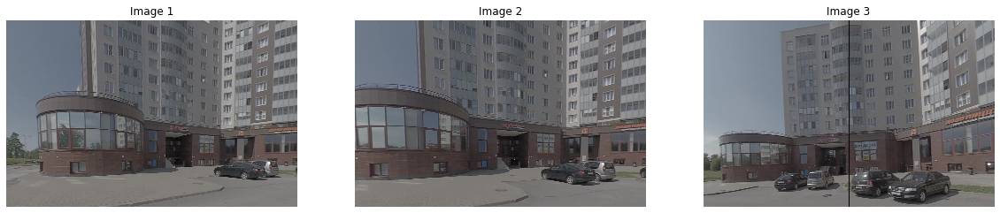

In [131]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, nrows=1, figsize=(20, 6))

ax1.imshow(rgb1)
ax1.set_title('Image 1')
ax1.set_axis_off()

ax2.imshow(rgb2)
ax2.set_title('Image 2')
ax2.set_axis_off()

ax3.imshow(rgb3)
ax3.set_title('Image 3')
ax3.set_axis_off()

plt.show()

In [132]:
images = [img1, img2, img3]

## Detect and visualize keypoints

In [133]:
def extract_features_dataset(images, extract_features_function):
    """
    Feature extractor and descriptor for the whole dataset
    
    :param images: a list of grayscale images
    :param extract_features_function: feature extractor and descriptor function for single image
    :return kp_list: a list of keypoints for each image
    :return des_list: a list of descriptors for each image
    """
    kp_list = []
    des_list = []
    
    for i in images:
        kp, des = extract_features_function(i)
        kp_list.append(kp)
        des_list.append(des)
        
    return kp_list, des_list

In [134]:
kp_sift, des_sift = extract_features_dataset(images, extract_features_sift)
kp_orb, des_orb = extract_features_dataset(images, extract_features_orb)

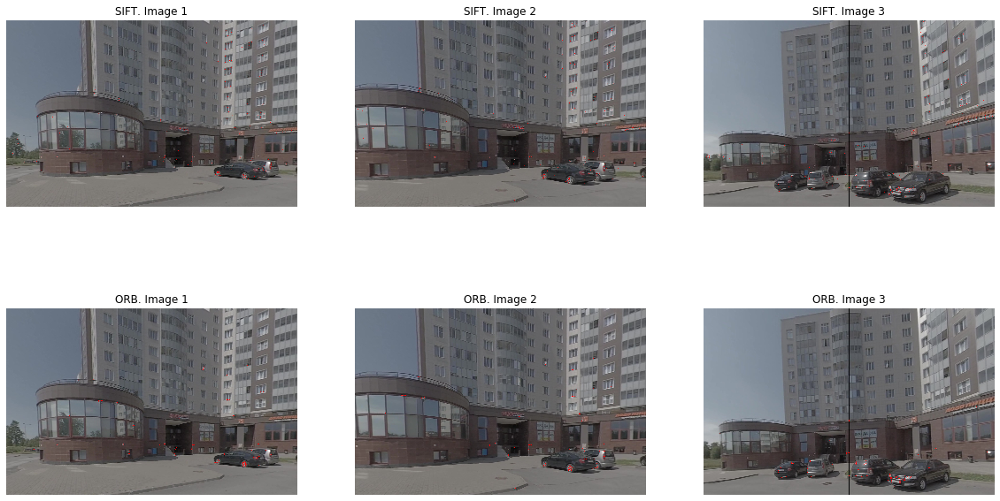

In [135]:
fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(20, 11))

display1 = cv2.drawKeypoints(rgb1, kp_sift[0], None, color=(255,0,0))
axes[0][0].imshow(display1)
axes[0][0].set_title('SIFT. Image 1')
axes[0][0].set_axis_off()

display2 = cv2.drawKeypoints(rgb2, kp_sift[1], None, color=(255,0,0))
axes[0][1].imshow(display2)
axes[0][1].set_title('SIFT. Image 2')
axes[0][1].set_axis_off()

display3 = cv2.drawKeypoints(rgb3, kp_sift[2], None, color=(255,0,0))
axes[0][2].imshow(display3)
axes[0][2].set_title('SIFT. Image 3')
axes[0][2].set_axis_off()

display4 = cv2.drawKeypoints(rgb1, kp_orb[0], None, color=(255,0,0))
axes[1][0].imshow(display4)
axes[1][0].set_title('ORB. Image 1')
axes[1][0].set_axis_off()

display5 = cv2.drawKeypoints(rgb2, kp_orb[1], None, color=(255,0,0))
axes[1][1].imshow(display5)
axes[1][1].set_title('ORB. Image 2')
axes[1][1].set_axis_off()

display6 = cv2.drawKeypoints(rgb3, kp_orb[2], None, color=(255,0,0))
axes[1][2].imshow(display6)
axes[1][2].set_title('ORB. Image 3')
axes[1][2].set_axis_off()

plt.show()

## Match keypoints and visualize

### BF and SIFT

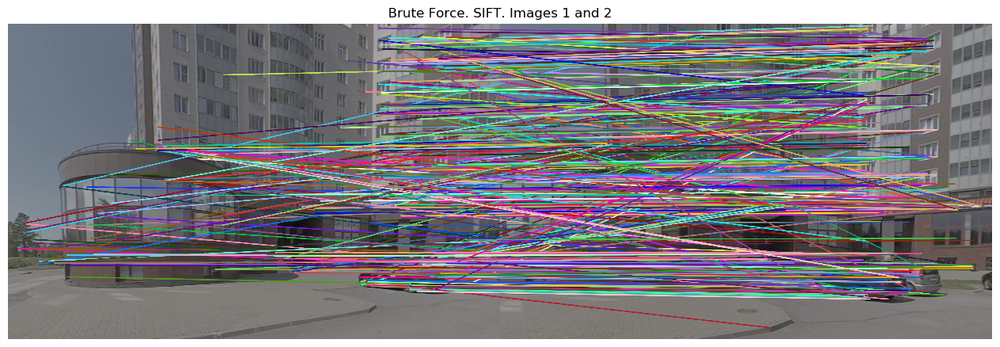

In [136]:
match = match_features_bf(des_sift[0], des_sift[1], k=1)
image_matches = cv2.drawMatches(rgb1, kp_sift[0], rgb2, kp_sift[1], matches1to2=[x[0] for x in match],
                                outImg=image_matches, matchesThickness=5, flags=2)

plt.figure(figsize=(16, 6), dpi=100)
plt.imshow(image_matches)
plt.axis('off')
plt.title('Brute Force. SIFT. Images 1 and 2')
plt.show()

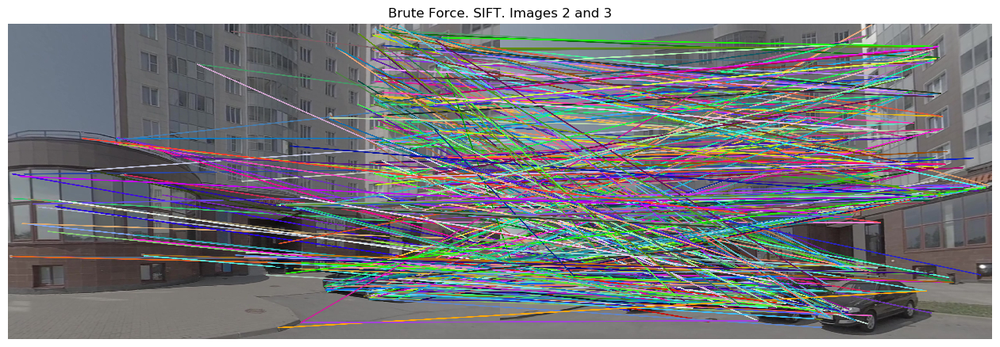

In [137]:
match = match_features_bf(des_sift[1], des_sift[2], k=1)
image_matches = cv2.drawMatches(rgb2, kp_sift[1], rgb3, kp_sift[2], matches1to2=[x[0] for x in match],
                                outImg=image_matches, matchesThickness=5, flags=2)

plt.figure(figsize=(16, 6), dpi=100)
plt.imshow(image_matches)
plt.axis('off')
plt.title('Brute Force. SIFT. Images 2 and 3')
plt.show()

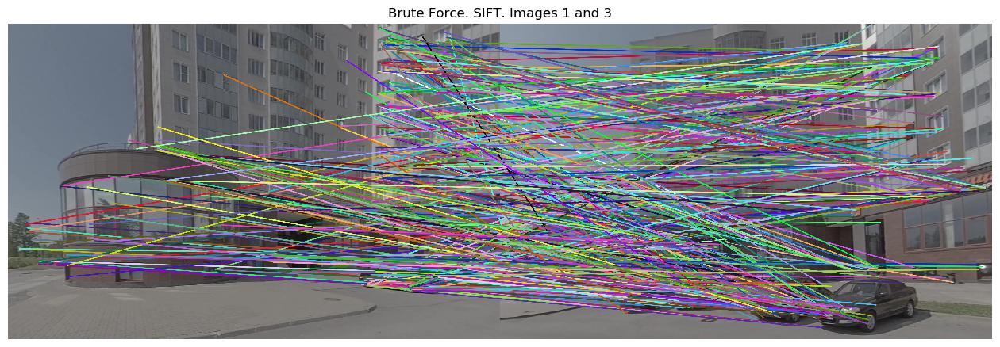

In [138]:
match = match_features_bf(des_sift[0], des_sift[2], k=1)
image_matches = cv2.drawMatches(rgb1, kp_sift[0], rgb3, kp_sift[2], matches1to2=[x[0] for x in match],
                                outImg=image_matches, matchesThickness=5, flags=2)

plt.figure(figsize=(16, 6), dpi=100)
plt.imshow(image_matches)
plt.axis('off')
plt.title('Brute Force. SIFT. Images 1 and 3')
plt.show()

### BF and ORB

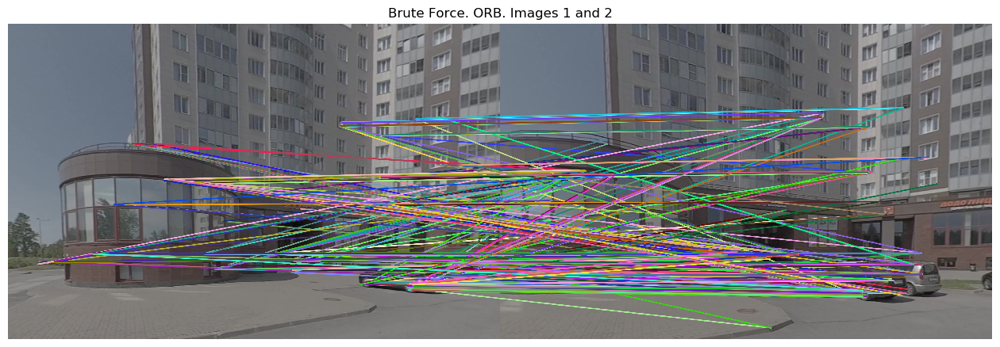

In [155]:
match = match_features_bf(des_orb[0], des_orb[1], k=1)
image_matches = cv2.drawMatches(rgb1, kp_orb[0], rgb2, kp_orb[1], matches1to2=[x[0] for x in match],
                                outImg=image_matches, matchesThickness=5, flags=2)

plt.figure(figsize=(16, 6), dpi=100)
plt.imshow(image_matches)
plt.axis('off')
plt.title('Brute Force. ORB. Images 1 and 2')
plt.show()

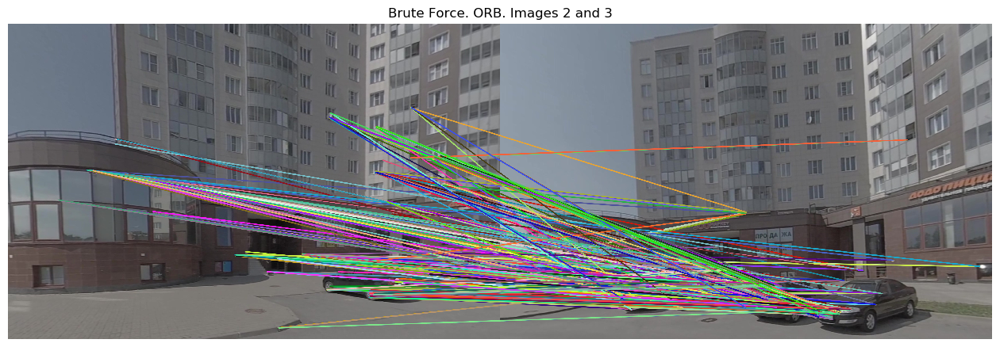

In [140]:
match = match_features_bf(des_orb[1], des_orb[2], k=1)
image_matches = cv2.drawMatches(rgb2, kp_orb[1], rgb3, kp_orb[2], matches1to2=[x[0] for x in match],
                                outImg=image_matches, matchesThickness=5, flags=2)

plt.figure(figsize=(16, 6), dpi=100)
plt.imshow(image_matches)
plt.axis('off')
plt.title('Brute Force. ORB. Images 2 and 3')
plt.show()

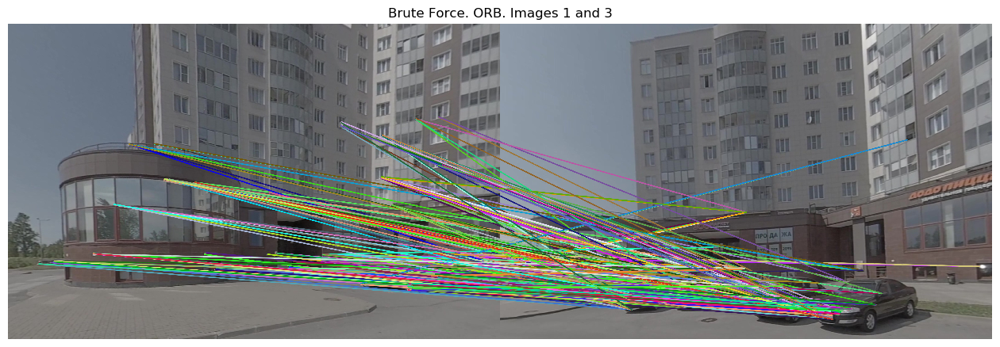

In [141]:
match = match_features_bf(des_orb[0], des_orb[2], k=1)
image_matches = cv2.drawMatches(rgb1, kp_orb[0], rgb3, kp_orb[2], matches1to2=[x[0] for x in match],
                                outImg=image_matches, matchesThickness=5, flags=2)

plt.figure(figsize=(16, 6), dpi=100)
plt.imshow(image_matches)
plt.axis('off')
plt.title('Brute Force. ORB. Images 1 and 3')
plt.show()

### FLANN and SIFT

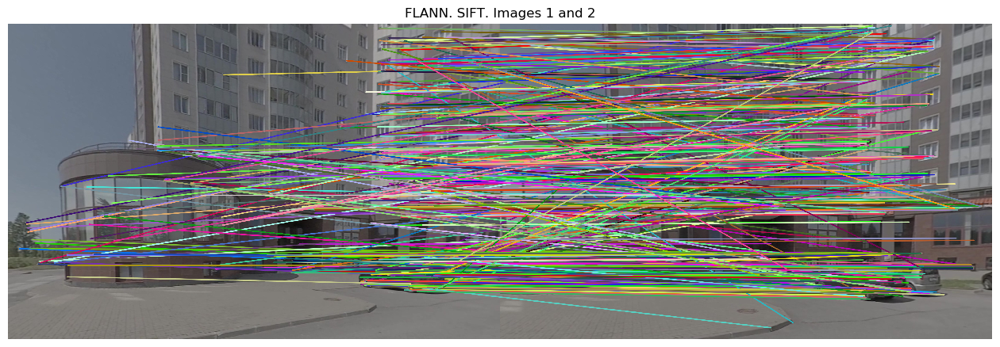

In [146]:
match = match_features_flann(des_sift[0], des_sift[1], k=1)
image_matches = cv2.drawMatches(rgb1, kp_sift[0], rgb2, kp_sift[1], matches1to2=[x[0] for x in match],
                                outImg=image_matches, matchesThickness=5, flags=2)

plt.figure(figsize=(16, 6), dpi=100)
plt.imshow(image_matches)
plt.axis('off')
plt.title('FLANN. SIFT. Images 1 and 2')
plt.show()

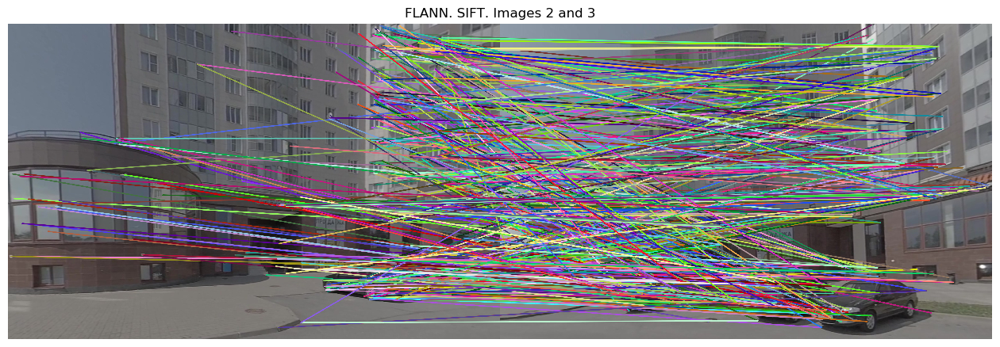

In [143]:
match = match_features_flann(des_sift[1], des_sift[2], k=1)
image_matches = cv2.drawMatches(rgb2, kp_sift[1], rgb3, kp_sift[2], matches1to2=[x[0] for x in match],
                                outImg=image_matches, matchesThickness=5, flags=2)

plt.figure(figsize=(16, 6), dpi=100)
plt.imshow(image_matches)
plt.axis('off')
plt.title('FLANN. SIFT. Images 2 and 3')
plt.show()

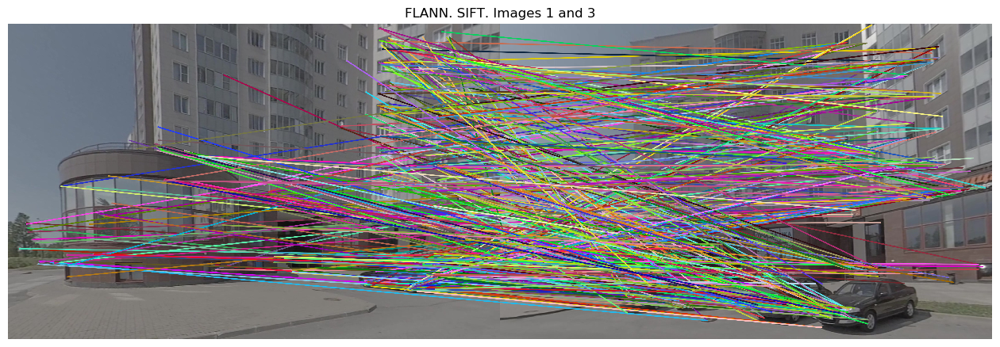

In [144]:
match = match_features_flann(des_sift[0], des_sift[2], k=1)
image_matches = cv2.drawMatches(rgb1, kp_sift[0], rgb3, kp_sift[2], matches1to2=[x[0] for x in match],
                                outImg=image_matches, matchesThickness=5, flags=2)

plt.figure(figsize=(16, 6), dpi=100)
plt.imshow(image_matches)
plt.axis('off')
plt.title('FLANN. SIFT. Images 1 and 3')
plt.show()

### FLANN and ORB

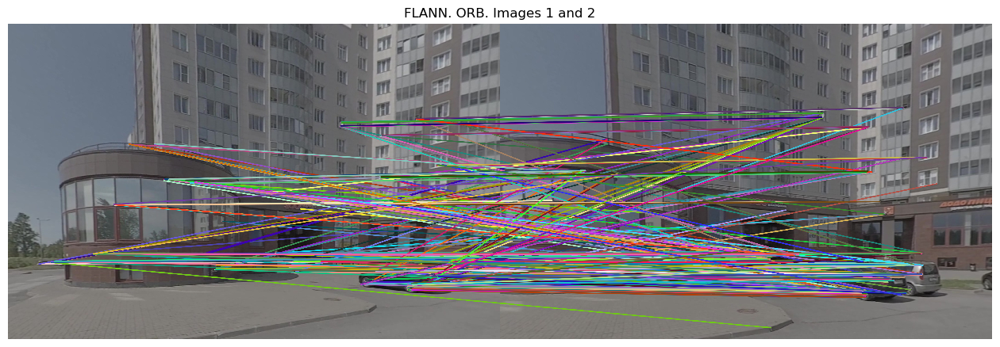

In [161]:
match = match_features_flann(des_orb[0].astype(np.float32), des_orb[1].astype(np.float32), k=1)
image_matches = cv2.drawMatches(rgb1, kp_orb[0], rgb2, kp_orb[1], matches1to2=[x[0] for x in match],
                                outImg=image_matches, matchesThickness=5, flags=2)

plt.figure(figsize=(16, 6), dpi=100)
plt.imshow(image_matches)
plt.axis('off')
plt.title('FLANN. ORB. Images 1 and 2')
plt.show()

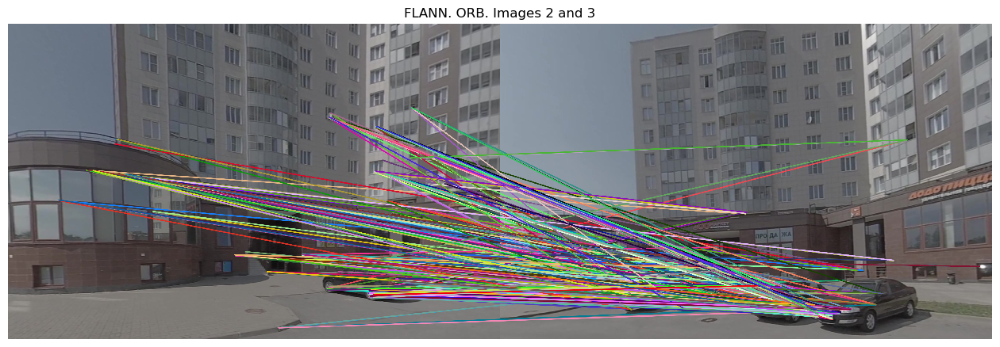

In [162]:
match = match_features_flann(des_orb[1].astype(np.float32), des_orb[2].astype(np.float32), k=1)
image_matches = cv2.drawMatches(rgb2, kp_orb[1], rgb3, kp_orb[2], matches1to2=[x[0] for x in match],
                                outImg=image_matches, matchesThickness=5, flags=2)

plt.figure(figsize=(16, 6), dpi=100)
plt.imshow(image_matches)
plt.axis('off')
plt.title('FLANN. ORB. Images 2 and 3')
plt.show()

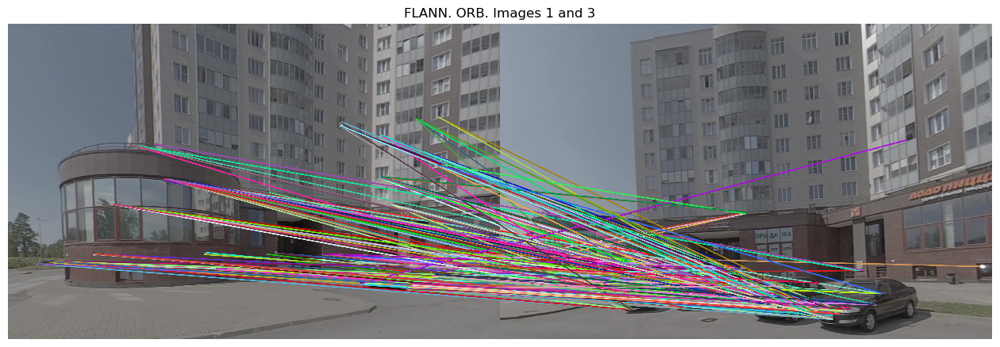

In [163]:
match = match_features_flann(des_orb[0].astype(np.float32), des_orb[2].astype(np.float32), k=1)
image_matches = cv2.drawMatches(rgb1, kp_orb[0], rgb3, kp_orb[2], matches1to2=[x[0] for x in match],
                                outImg=image_matches, matchesThickness=5, flags=2)

plt.figure(figsize=(16, 6), dpi=100)
plt.imshow(image_matches)
plt.axis('off')
plt.title('FLANN. ORB. Images 1 and 3')
plt.show()